<a href="https://www.kaggle.com/code/rubanzasilva/xgb-lgb-cat-neural-nets-with-fast-ai?scriptVersionId=203348888" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Loan Approval Prediction

The goal for this competition is to predict whether an applicant is approved for a loan.

# Library and Data import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s4e10/sample_submission.csv
/kaggle/input/playground-series-s4e10/train.csv
/kaggle/input/playground-series-s4e10/test.csv
/kaggle/input/loan-approval-prediction/credit_risk_dataset.csv
/kaggle/input/s04e10-autogluon-model/submission.csv
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248SummaryOfModels.html
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/version.txt
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/metadata.json
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/learner.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/predictor.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/utils/data/X.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/utils/data/y.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/trainer.pkl
/kaggle/input/s04e10-autogluo

In [2]:
%%time
%pip install catboost
%pip install optuna
#%pip install optuna_distributed
#%pip install openfe
%pip install seaborn
%pip install xgboost
%pip install lightgbm
%pip install fastkaggle
#%pip install h2o
%pip install -Uqq fastbook
#%pip install polars
%pip install -q -U autogluon.tabular
%pip install autogluon
#%pip install --upgrade pip
%pip install tqdm
#%pip install wandb
#%pip install sweetviz

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiobotocore 2.15.0 requires botocore<1.35.17,>=1.35.16, but you have botocore 1.29.165 which is incompatible.
bigframes 0.22.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.10.0, but you have google-cloud-bigquery 2.34.4 which is incompatible.
bigframes 0.22.0 requires google-cloud-storage>=2.0.0, but you have google-cloud-storage 1.44.0 which is incompat

In [3]:
!pip install h2o
!pip install requests
!pip install tabulate
!pip install future

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm

import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.tabular.all import *
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm
from ipywidgets import interact

from fastai.imports import *
np.set_printoptions(linewidth=130)


from sklearn.ensemble import RandomForestClassifier
#from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import VotingClassifier,StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold,StratifiedKFold, cross_val_score,train_test_split,GridSearchCV


from pathlib import Path
import os

import xgboost as xgb
from xgboost import plot_importance
from xgboost import XGBClassifier

import lightgbm as lgb
from lightgbm import LGBMClassifier

from catboost import CatBoostClassifier,CatBoostRegressor,Pool, metrics, cv


import warnings


#from openfe import OpenFE, transform
from autogluon.tabular import TabularDataset, TabularPredictor

#import h2o
#from h2o.automl import H2OAutoML

import gc

import optuna
from optuna.samplers import TPESampler

import pickle
from joblib import dump, load
#import sweetviz as sv
#from IPython.display import FileLink

import h2o
from h2o.automl import H2OAutoML

In [5]:
!ls /kaggle/input/playground-series-s4e10

sample_submission.csv  test.csv  train.csv


In [6]:
path = Path('/kaggle/input/playground-series-s4e10/')
path

Path('/kaggle/input/playground-series-s4e10')

In [7]:
!ls 

__notebook__.ipynb


In [8]:
train_df = pd.read_csv(path/'train.csv',index_col='id')
test_df = pd.read_csv(path/'test.csv',index_col='id')
sub_df = pd.read_csv(path/'sample_submission.csv')
original = pd.read_csv('/kaggle/input/loan-approval-prediction/credit_risk_dataset.csv')

In [9]:
train_df.shape,original.shape

((58645, 12), (32581, 12))

In [10]:
train_df = pd.concat([train_df, original], ignore_index=True)

In [11]:
train_df.shape

(91226, 12)

In [12]:
#comp = 'playground-series-s4e10'

#path = setup_comp(comp, install='fastai "timm>=0.6.2.dev0"')

In [13]:
#iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

#if iskaggle: path = Path('playground-series-s4e10/')
#else:
    #import zipfile,kaggle
    #path = Path('playground-series-s4e10')
    #kaggle.api.competition_download_cli(str(path))
    #zipfile.ZipFile(f'{path}.zip').extractall(pat

# Exploratory Data Analysis

In [14]:
train_df.shape

(91226, 12)

In [15]:
train_df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [16]:
train_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


Missing value check

In [17]:
missing_values_count = train_df.isnull().sum()
sorted_missing_values = missing_values_count.sort_values(ascending=False)
print(sorted_missing_values)

loan_int_rate                 3116
person_emp_length              895
person_age                       0
person_income                    0
person_home_ownership            0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
loan_status                      0
dtype: int64


In [18]:
#Missing values returned as percentages.
missing_percentages = train_df.isnull().mean() * 100
sorted_missing_percentages = missing_percentages.sort_values(ascending=False)
print(sorted_missing_percentages)

loan_int_rate                 3.415693
person_emp_length             0.981080
person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
loan_status                   0.000000
dtype: float64


# fast.ai preprocessing

In [19]:
cont_names,cat_names = cont_cat_split(train_df, dep_var='loan_status')
splits = RandomSplitter(valid_pct=0.2)(range_of(train_df))
to = TabularPandas(train_df, procs=[Categorify, FillMissing,Normalize],
#to = TabularPandas(train_df, procs=[Categorify,Normalize],
                   cat_names = cat_names,
                   cont_names = cont_names,
                   y_names='loan_status',
                   y_block=CategoryBlock(),
                   splits=splits)
dls = to.dataloaders(bs=64)
#dls = to.dataloaders(bs=1024)
test_dl = dls.test_dl(test_df)
X_train, y_train = to.train.xs, to.train.ys.values.ravel()
X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)
/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exampl

# Modelling

## Neural Network

In [20]:
learn = tabular_learner(dls, metrics=RocAucBinary())

SuggestedLRs(valley=0.0030199517495930195)

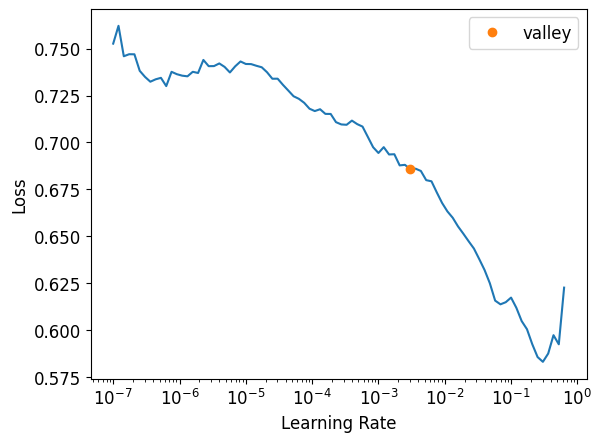

In [21]:
learn.lr_find()

In [22]:
learn.fit_one_cycle(30,1e-6)

epoch,train_loss,valid_loss,roc_auc_score,time
0,0.739897,0.726938,0.625291,00:15
1,0.722690,0.717139,0.649856,00:15
2,0.712935,0.680854,0.653539,00:15
3,0.677493,0.676122,0.793572,00:15
4,0.658794,0.654202,0.829866,00:15
5,0.641448,0.628949,0.844014,00:15
6,0.628749,0.598073,0.840571,00:15
7,0.613246,0.605215,0.853744,00:15
8,0.609786,0.592077,0.859211,00:15
9,0.605375,0.602589,0.860112,00:15


In [23]:
dl = test_dl

In [24]:
learn.save('nn_model_loan_approval_v1')

Path('models/nn_model_loan_approval_v1.pth')

In [25]:
#learn.load('nn_model_loan_approval_v1')  

In [26]:
#test_df.shape

In [27]:
nn_preds_x1 = learn.get_preds(dl=dl)[0]

In [28]:
nn_preds_x1

tensor([[0.0269, 0.9731],
        [0.6760, 0.3240],
        [0.1603, 0.8397],
        ...,
        [0.4735, 0.5265],
        [0.0231, 0.9769],
        [0.0542, 0.9458]])

In [29]:
#i select the 2nd column of the nn_preds
final_preds = nn_preds_x1[:, 1]
final_preds

tensor([0.9731, 0.3240, 0.8397,  ..., 0.5265, 0.9769, 0.9458])

In [30]:
final_preds.shape

torch.Size([39098])

In [31]:
#sub_df['loan_status'] = final_preds
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

In [32]:
#dl = test_dl
#nn_preds = learn.get_preds(dl=dl)
#nn_preds_x = learn.get_preds()[0]
#a_preds, _ = learn.get_preds(dl=dl)
#nn_preds_y = a_preds.squeeze(1)
#nn_preds_proba = (a_preds[:, 1])

## XGBoost

In [33]:
xgb_params = {
    'eta': 0.044303752452182654,
    'n_estimators': 7238,
    'colsample_bytree': 0.7616580256429863,
    'subsample': 0.6586623872476727,
    'max_depth': 7,
    'min_child_weight': 17, 
    'booster': 'gbtree',
    'tree_method':'hist',
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'device':'cuda',
}


lgbm_params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'num_leaves': 239,
    'learning_rate': 0.0030069363268241766,
    'n_estimators': 7689,
    'subsample_for_bin': 279725,
    'min_child_samples': 144, 
    'reg_alpha': 1.9893991901582224e-09,
    'reg_lambda': 0.18713346824755625, 
    'colsample_bytree': 0.5892053831677966,
    'subsample': 0.3744929266207266,
    'max_depth': 9
}

cat_optuna_params = {
    'loss_function': 'Logloss',
    'eval_metric': 'AUC',
    #'class_names': [0, 1],
    'learning_rate': 0.05,
    'iterations': 5000,
    'depth': 12,
    'random_strength': 0,
    'l2_leaf_reg': 0.5,
    #'max_leaves': 512,
    'fold_permutation_block': 64,
    #'task_type': 'GPU',
    #'devices': '0:1',
    'random_seed': 42,
    'verbose': False,
    'allow_writing_files': False
}

cat_params = {
    'depth': 8,
    'learning_rate': 0.19793301995319765,
    'bagging_temperature': 0.7779373495258176,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 300,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
}

#xgb params from https://www.kaggle.com/code/adyiemaz/xgb-loan-approval-prediction
xgb_params_adyiemaz = {
    'colsample_bytree': 0.5,
    'learning_rate' :0.05,
    'max_depth':5,
    'n_estimators':800,
    'reg_alpha': 1,
    'reg_lambda':0.5,
    'subsample':1,
    'eval_metric':'auc',
    'gamma':0,
    'random_state':42,
    #'early_stopping_rounds':50
}

### Optuna optimization

In [34]:
#def objective(trial):
    #params = {
        #'num_leaves': trial.suggest_int('num_leaves', 100, 500),
        #'eta': trial.suggest_float('eta', 0.001, 1.0, log=True),
        #'n_estimators': trial.suggest_int('n_estimators', 300, 10000),
        #'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        #'subsample': trial.suggest_float('subsample', 0.25, 1.0),
        #'max_depth': trial.suggest_int('max_depth', 1, 15),
        #'objective': 'binary:logistic',
        #'eval_metric': 'auc',
        #'device':'cuda',

    #}
    
    #K_FOLDS = 10  # Number of folds for cross-validation
    #kfold = KFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

    #xgb_fold_scores = []
    
    #for train_index, test_index in kfold.split(train_df):
    #print(f'train: {len(train_index)} samples, test: {len(test_index)} samples')

    #for train_index, val_index in kfold.split(X_train):
        #X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
        #y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
        
        # Train the model on the current fold
        
        #xgb_model_fold = xgb.XGBClassifier(**xgb_optuna_params)
        #xgb_model_fold.fit(X_fold_train, y_fold_train)
        
        # Predict probabilities on the validation set for the current fold
        #y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
        #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
        
        # Calculate and store the AUC-ROC score for the current fold
        #xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
        #xgb_fold_scores.append(xgb_cv_score)
        
        # Calculate the average score across all folds
        #return np.mean(xgb_fold_scores)

# Create and run the study
#study = optuna.create_study(sampler=TPESampler(n_startup_trials=30, multivariate=True, seed=0), direction="maximize")
#study.optimize(objective, n_trials=100)

#print('Best value:', study.best_value)
#print('Best trial:', study.best_trial.params)

### XGB model cross validation

In [35]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
xgb_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    xgb_model_fold = xgb.XGBClassifier(**xgb_params_adyiemaz)
    xgb_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    xgb_fold_scores.append(xgb_cv_score)
    
    print(f"Fold {fold} AUC: {xgb_cv_score}")

# Calculate and print the mean score across all folds
xgb_mean_score = np.mean(xgb_fold_scores)
print(f"Mean AUC: {xgb_mean_score}")

Fold 1 AUC: 0.956591521150805
Fold 2 AUC: 0.9561724433274508
Fold 3 AUC: 0.9600551990608854
Fold 4 AUC: 0.9554138853570672
Fold 5 AUC: 0.9569806897647808
Fold 6 AUC: 0.9593295719432083
Fold 7 AUC: 0.957020820089002
Fold 8 AUC: 0.9529691142191142
Fold 9 AUC: 0.9528779932189023
Fold 10 AUC: 0.955322631913541
Mean AUC: 0.9562733870044756
CPU times: user 1min 39s, sys: 629 ms, total: 1min 40s
Wall time: 50.4 s


### On full dataset

In [36]:
%%time
xgb_model = xgb.XGBClassifier(**xgb_params_adyiemaz)
xgb_model = xgb_model.fit(X_train, y_train)

#xgb_preds = tensor(xgb_model.predict(test_dl.xs))
xgb_preds_proba = tensor(xgb_model.predict_proba(test_dl.xs))[:, 1]

xgb_preds_x = tensor(xgb_model.predict(X_test))
xgb_preds_x_proba = tensor(xgb_model.predict_proba(X_test))[:, 1]

xgb_score = roc_auc_score(y_test,xgb_preds_x_proba)
xgb_score

CPU times: user 12 s, sys: 62.8 ms, total: 12.1 s
Wall time: 6.04 s


0.9591044339150199

In [37]:
#submission
!rm submission.csv
#sub_df['loan_status'] = xgb_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


## LGBM

In [38]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
lgbm_fold_scores = []

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    lgbm_model_fold = lgb.LGBMClassifier(**lgbm_params)
    lgbm_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = lgbm_model_fold.predict_proba(X_fold_val)[:, 1]
    y_pred_fold_tt = lgbm_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Root Mean Squared Error for the current fold
    lgbm_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    lgbm_fold_scores.append(lgbm_cv_score)
    
    print(f"Fold {fold} AUC: {lgbm_cv_score}")

# Calculate and print the mean score across all folds
lgbm_mean_score = np.mean(lgbm_fold_scores)
print(f"Mean RMSE: {lgbm_mean_score}")

[LightGBM] [Info] Number of positive: 11234, number of negative: 54448
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 948
[LightGBM] [Info] Number of data points in the train set: 65682, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171036 -> initscore=-1.578301
[LightGBM] [Info] Start training from score -1.578301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [39]:
print(f"Mean RMSE: {lgbm_mean_score}")

Mean RMSE: 0.9586461519401721


In [40]:
%%time
#ds subset
lgbm_model = lgb.LGBMClassifier(**lgbm_params)
lgbm_model = lgbm_model.fit(X_train, y_train)

#test set preds
#lgbm_preds = tensor(lgbm_model.predict(test_dl.xs))
lgbm_preds_proba = tensor(lgbm_model.predict_proba(test_dl.xs))[:, 1]

lgbm_preds_x_prob = tensor(lgbm_model.predict_proba(X_test))[:, 1]

lgbm_score = roc_auc_score(y_test,lgbm_preds_x_prob)
lgbm_score

[LightGBM] [Info] Number of positive: 12483, number of negative: 60498
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 955
[LightGBM] [Info] Number of data points in the train set: 72981, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171045 -> initscore=-1.578243
[LightGBM] [Info] Start training from score -1.578243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

0.9617482843825153

In [41]:
lgbm_score

0.9617482843825153

In [42]:
#submission
!rm submission.csv
#sub_df['loan_status'] = lgbm_preds_prob
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


Load lightgbm model from autogluon

In [43]:
!ls /kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/LightGBMXT_BAG_L2

S1F1  S1F2  S1F3  S1F4	S1F5  S1F6  S1F7  S1F8	model.pkl  utils


In [44]:
#/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/LightGBMXT_BAG_L2/model.pkl

# Load the model
with open('/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248/models/LightGBMXT_BAG_L2/model.pkl', 'rb') as file:
    loaded_lgbm_model = pickle.load(file)

In [45]:
%%time
# Load the full predictor
predictor = TabularPredictor.load('/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248')

# Convert test_dl.xs to DataFrame if it isn't already
if not isinstance(test_dl.xs, pd.DataFrame):
    # Get feature names if available
    feature_names = [f'feature_{i}' for i in range(test_dl.xs.shape[1])]  # create generic feature names
    test_data = pd.DataFrame(test_dl.xs.numpy(), columns=feature_names)
else:
    test_data = test_dl.xs

# Get predictions using the specific model
autogluon_lgbm_preds_proba = tensor(predictor.predict_proba(test_data, model='LightGBMXT_BAG_L2'))[:, 1]

print("Predictions shape:", autogluon_lgbm_preds_proba.shape)

Predictions shape: torch.Size([39098])
CPU times: user 20min 36s, sys: 6.3 s, total: 20min 42s
Wall time: 11min 1s


In [46]:
loaded_lgbm_model

In [47]:
#autogluon_lgbm_preds_proba = tensor(loaded_lgbm_model.predict_proba(test_dl.xs))[:, 1]

## Random Forests

In [48]:
%%time
rf = RandomForestClassifier(500, min_samples_leaf=3)
rf_model = rf.fit(X_train, y_train);

rf_preds = tensor(rf_model.predict(test_dl.xs))
rf_preds_proba = tensor(rf_model.predict_proba(test_dl.xs))[:, 1]

rf_preds_x = tensor(rf_model.predict(X_test))
rf_preds_proba_x = tensor(rf_model.predict_proba(X_test))[:, 1]

rf_score = roc_auc_score(y_test,rf_preds_proba_x)
rf_score

CPU times: user 1min 14s, sys: 24.8 ms, total: 1min 14s
Wall time: 1min 14s


0.939238678575556

In [49]:
#!rm submission.csv
#sub_df['loan_status'] = rf_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

## CatBoost

In [50]:
%%time
#using full ds
cat_model = CatBoostClassifier(**cat_params)
cat_model = cat_model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=False)

#test set preds
cat_preds_proba = tensor(cat_model.predict_proba(test_dl.xs))[:, 1]
#cat_preds_final = cat_preds.squeeze(1)

#validation set preds

cat_preds_proba_x = tensor(cat_model.predict_proba(X_test))[:, 1]

cat_score = roc_auc_score(y_test,cat_preds_proba_x)
cat_score

CPU times: user 30.5 s, sys: 2.9 s, total: 33.4 s
Wall time: 8.93 s


0.9615137276914696

In [51]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
cat_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    cat_model_fold = CatBoostClassifier(**cat_params)
    cat_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = cat_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    cat_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    cat_fold_scores.append(cat_cv_score)
    
    print(f"Fold {fold} AUC: {cat_cv_score}")

# Calculate and print the mean score across all folds
cat_mean_score = np.mean(cat_fold_scores)
print(f"Mean AUC: {cat_mean_score}")

0:	total: 24.3ms	remaining: 7.25s
1:	total: 53.6ms	remaining: 7.98s
2:	total: 73.2ms	remaining: 7.25s
3:	total: 92.9ms	remaining: 6.87s
4:	total: 117ms	remaining: 6.9s
5:	total: 140ms	remaining: 6.86s
6:	total: 162ms	remaining: 6.78s
7:	total: 188ms	remaining: 6.84s
8:	total: 213ms	remaining: 6.87s
9:	total: 234ms	remaining: 6.78s
10:	total: 262ms	remaining: 6.89s
11:	total: 287ms	remaining: 6.88s
12:	total: 314ms	remaining: 6.94s
13:	total: 342ms	remaining: 6.98s
14:	total: 371ms	remaining: 7.04s
15:	total: 398ms	remaining: 7.06s
16:	total: 422ms	remaining: 7.02s
17:	total: 447ms	remaining: 7.01s
18:	total: 479ms	remaining: 7.08s
19:	total: 509ms	remaining: 7.12s
20:	total: 539ms	remaining: 7.16s
21:	total: 570ms	remaining: 7.2s
22:	total: 599ms	remaining: 7.21s
23:	total: 627ms	remaining: 7.21s
24:	total: 657ms	remaining: 7.23s
25:	total: 686ms	remaining: 7.23s
26:	total: 717ms	remaining: 7.25s
27:	total: 743ms	remaining: 7.22s
28:	total: 774ms	remaining: 7.23s
29:	total: 806ms	remai

In [52]:
#submission
#!rm submission.csv
#sub_df['loan_status'] = cat_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

## Logistic Regression

In [53]:
lr_clf = LogisticRegression(random_state=0).fit(X_train, y_train)

In [54]:
lr_clf

LogisticRegression(random_state=0)

In [55]:
lr_preds_proba = tensor(lr_clf.predict_proba(test_dl.xs))[:, 1]

lr_preds_proba_x = tensor(lr_clf.predict_proba(X_test))[:, 1]

lr_score = roc_auc_score(y_test,lr_preds_proba_x)
lr_score

0.8669301921161392

In [56]:
# Create and train the logistic regression model
lr_model = LogisticRegression(
    max_iter=10000,        # Increase max iterations to ensure convergence
    random_state=42,      # For reproducibility
    #class_weight='balanced' # To handle any class imbalance
)

In [57]:
lr_model = lr_model.fit(X_train, y_train)

In [58]:
lr_preds_proba = tensor(lr_model.predict_proba(test_dl.xs))[:, 1]

lr_preds_proba_x = tensor(lr_model.predict_proba(X_test))[:, 1]

lr_score = roc_auc_score(y_test,lr_preds_proba_x)
lr_score

0.8669301921161392

In [59]:
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

lr_grid = GridSearchCV(
    LogisticRegression(random_state=42, class_weight='balanced'),
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1
)

# Fit grid search
lr_grid.fit(X_train, y_train)

# Print best parameters
print("Best parameters:", lr_grid.best_params_)
print("Best AUC score:", lr_grid.best_score_)

# Use best model for predictions
best_lr = lr_grid.best_estimator_
best_train_pred = best_lr.predict_proba(X_train)[:, 1]
best_test_pred = best_lr.predict_proba(X_test)[:, 1]

print(f'Best model training AUC: {roc_auc_score(y_train, best_train_pred):.4f}')
print(f'Best model testing AUC: {roc_auc_score(y_test, best_test_pred):.4f}')

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

Best parameters: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Best AUC score: 0.8688121598312414
Best model training AUC: 0.8690
Best model testing AUC: 0.8676


# Ensemble

## Stacking

In [60]:
stacking_estimators = [
    ('cat_boost',cat_model),
    #('rf',rf_model),
    ('lgbm',lgbm_model),
    #('xgb',xgb_model),
]
stacking_classifier_cat_lgbm= StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=LogisticRegression(),
    cv=5
)
#stacking_classifier_cat_lgbm= StackingClassifier(
    #estimators=stacking_estimators,
    #final_estimator=lgb.LGBMClassifier(**lgbm_params),
    #cv=5
#)
stacking_classifier_cat_lgbm.fit(X_train, y_train)

# Predict probabilities
stacking_preds_proba_cat_lgbm = (stacking_classifier_cat_lgbm.predict_proba(test_dl.xs))[:, 1]
stacking_preds_proba_x_cat_lgbm = stacking_classifier_cat_lgbm.predict_proba(X_test)[:, 1]

stacking_score_cat_lgbm = roc_auc_score(y_test, stacking_preds_proba_x_cat_lgbm)

print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

0:	total: 27.3ms	remaining: 8.18s
1:	total: 55.3ms	remaining: 8.25s
2:	total: 80.2ms	remaining: 7.94s
3:	total: 108ms	remaining: 7.96s
4:	total: 129ms	remaining: 7.61s
5:	total: 154ms	remaining: 7.57s
6:	total: 179ms	remaining: 7.48s
7:	total: 209ms	remaining: 7.62s
8:	total: 234ms	remaining: 7.57s
9:	total: 266ms	remaining: 7.72s
10:	total: 293ms	remaining: 7.7s
11:	total: 325ms	remaining: 7.8s
12:	total: 355ms	remaining: 7.83s
13:	total: 385ms	remaining: 7.87s
14:	total: 422ms	remaining: 8.01s
15:	total: 454ms	remaining: 8.05s
16:	total: 485ms	remaining: 8.08s
17:	total: 516ms	remaining: 8.09s
18:	total: 550ms	remaining: 8.13s
19:	total: 580ms	remaining: 8.12s
20:	total: 613ms	remaining: 8.14s
21:	total: 647ms	remaining: 8.18s
22:	total: 681ms	remaining: 8.21s
23:	total: 712ms	remaining: 8.19s
24:	total: 743ms	remaining: 8.17s
25:	total: 775ms	remaining: 8.16s
26:	total: 805ms	remaining: 8.14s
27:	total: 833ms	remaining: 8.09s
28:	total: 868ms	remaining: 8.11s
29:	total: 902ms	remain

In [61]:
print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

Final Stacking Classifier AUC-ROC on test set: 0.9630114631314215


Testing out using lr as a model and xgb as a meta model

In [62]:
stacking_estimators = [
    ('cat_boost',cat_model),
    #('rf',rf_model),
    ('lgbm',lgbm_model),
    #('xgb',xgb_model),
    ('lr',lr_clf)
]
stacking_classifier_cat_lgbm_lr= StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=xgb.XGBClassifier(**xgb_params_adyiemaz),
    cv=5
)
stacking_classifier_cat_lgbm_lr.fit(X_train, y_train)

# Predict probabilities
stacking_preds_proba_cat_lgbm_lr = (stacking_classifier_cat_lgbm_lr.predict_proba(test_dl.xs))[:, 1]
stacking_preds_proba_x_cat_lgbm_lr = stacking_classifier_cat_lgbm_lr.predict_proba(X_test)[:, 1]

stacking_score_cat_lgbm_lr = roc_auc_score(y_test, stacking_preds_proba_x_cat_lgbm_lr)

print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm_lr}")

0:	total: 25.1ms	remaining: 7.52s
1:	total: 52.6ms	remaining: 7.83s
2:	total: 86.7ms	remaining: 8.58s
3:	total: 124ms	remaining: 9.17s
4:	total: 162ms	remaining: 9.55s
5:	total: 191ms	remaining: 9.35s
6:	total: 215ms	remaining: 9.02s
7:	total: 247ms	remaining: 9s
8:	total: 269ms	remaining: 8.7s
9:	total: 300ms	remaining: 8.7s
10:	total: 327ms	remaining: 8.58s
11:	total: 358ms	remaining: 8.59s
12:	total: 387ms	remaining: 8.54s
13:	total: 416ms	remaining: 8.51s
14:	total: 451ms	remaining: 8.57s
15:	total: 482ms	remaining: 8.55s
16:	total: 513ms	remaining: 8.53s
17:	total: 543ms	remaining: 8.51s
18:	total: 577ms	remaining: 8.53s
19:	total: 607ms	remaining: 8.49s
20:	total: 639ms	remaining: 8.49s
21:	total: 675ms	remaining: 8.53s
22:	total: 709ms	remaining: 8.53s
23:	total: 740ms	remaining: 8.51s
24:	total: 771ms	remaining: 8.48s
25:	total: 805ms	remaining: 8.48s
26:	total: 835ms	remaining: 8.44s
27:	total: 863ms	remaining: 8.38s
28:	total: 901ms	remaining: 8.42s
29:	total: 934ms	remaining

In [63]:
print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm_lr}")

Final Stacking Classifier AUC-ROC on test set: 0.9617513221398579


In [64]:
#stacking_preds_proba_cat_lgbm_xgb = (stacking_preds_proba_cat_lgbm_xgb.predict_proba(test_dl.xs))[:, 1]

In [65]:
#submission
!rm submission.csv
#sub_df['loan_status'] = stacking_preds_proba_cat_lgbm
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


# AutoGluon

In [66]:
target = 'loan_status'
eval_metric = 'roc_auc'
train_data = train_df
Time_limit = 3600*11
#Time_limit = 900
problem_type='binary'

In [67]:
#%%time
#predictor = TabularPredictor(label=target, eval_metric=eval_metric,verbosity=1,problem_type=problem_type).fit(
    #train_data, presets='best_quality',excluded_model_types=['KNN'], time_limit=Time_limit,
    #ag_args_fit={
        #'num_gpus': 2, 
        #'stopping_metric': 'log_loss'
    #}
#)

#results = predictor.fit_summary()

Since AutoGluon has a feature that enables us to save models for use later, i built an autogluon solution using the above code and saved the models as a dataset so i can be able to call it in this notebook as using the line of code below.

If you are interested in running the autogluon solution yourself, you can just enable your gpu, uncomment the code and run it.

In [68]:
#predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241005_150901")
predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248")

In [69]:
autogluon_preds_proba = predictor.predict_proba(test_df).iloc[:, 1]

In [70]:
autogluon_preds_proba = torch.tensor(autogluon_preds_proba.values)

In [71]:
stacking_preds_proba_cat_lgbm = torch.tensor(stacking_preds_proba_cat_lgbm)

In [72]:
#stacking_preds_proba_cat_lgbm_xgb = torch.tensor(stacking_preds_proba_cat_lgbm_xgb)

# H2O

In [73]:
y = "loan_status"

In [74]:
#h2o.init()

In [75]:
#train_data = h2o.H2OFrame(train_df)

In [76]:
#test_data = h2o.H2OFrame(test_df)

In [77]:
# For binary classification, target should be a factor
#train_data[y] = train_data[y].asfactor()

#test_data[y] = test_data[y].asfactor()

In [78]:
#%%time

#aml = H2OAutoML(max_runtime_secs=3600*10,seed=42)
#you can deccrease the time limit for a faster search by commenting the code above and 
# commenting out code below and vice versa
#aml = H2OAutoML(max_runtime_secs=300,seed=42)

#aml.train(y='loan_status', training_frame=train_data)

In [79]:
# Get leaderboard with all possible columns
#lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
#lb

In [80]:
#leaderboard = aml.leaderboard
#print(leaderboard)
#best_model = aml.leader
#print(best_model)

In [81]:
#predictions = best_model.predict(test_data)
#predictions_df = predictions.as_data_frame()

In [82]:
#prediction_probabilities = predictions_df.iloc[:, 2]
#prediction_probabilities

In [83]:
#h2o_preds_proba = torch.tensor(prediction_probabilities.values)
#h2o_preds_proba

In [84]:
#h2o_preds_proba.shape

## Averaging

In [85]:
lgbm_autogluon_proba = (lgbm_preds_proba + autogluon_preds_proba)/2
lgbm_autogluon_proba.shape

torch.Size([39098])

In [86]:
stacking_autogluon_proba_cat_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba)/2
stacking_autogluon_proba_cat_lgbm.shape

torch.Size([39098])

In [87]:
stacking_autogluon_proba_cat_lgbm_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + lgbm_preds_proba )/3
stacking_autogluon_proba_cat_lgbm_lgbm.shape

torch.Size([39098])

In [88]:
lgbm_xgb_proba = (lgbm_preds_proba + xgb_preds_proba)/2
lgbm_xgb_proba.shape

torch.Size([39098])

In [89]:
#stacking_autogluon_proba_cat_lgbm_h2o = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + h2o_preds_proba)/3
#stacking_autogluon_proba_cat_lgbm_h2o.shape

In [90]:
#stacking_autogluon_proba_cat_lgbm_nn = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + final_preds)/3
#stacking_autogluon_proba_cat_lgbm_nn.shape

In [91]:
#autogluon_proba_h2o = (autogluon_preds_proba + h2o_preds_proba)/2
#autogluon_proba_h2o.shape

In [92]:
#stacking_h2o = (stacking_preds_proba_cat_lgbm + h2o_preds_proba)/2
#stacking_h2o.shape

In [93]:
#lgbm_stacking_autogluon_proba = (lgbm_preds_proba + stacking_preds_proba + autogluon_preds_proba)/3
#lgbm_stacking_autogluon_proba.shape

In [94]:
#submission
!rm submission.csv
sub_df['loan_status'] = stacking_autogluon_proba_cat_lgbm
sub_df.to_csv('submission.csv', index=False)
sub = pd.read_csv('submission.csv')
sub

rm: cannot remove 'submission.csv': No such file or directory


,id,loan_status
0,58645,0.990261
1,58646,0.025541
2,58647,0.679931
3,58648,0.016642
4,58649,0.031246
...,...,...
39093,97738,0.041026
39094,97739,0.015542
39095,97740,0.017114
39096,97741,0.219308


# Ranking performance

In [95]:
AUC = pd.DataFrame({
    'algorithm': [ 'XGBoost','XGBoost CV','LGBM',
                  'LGBM CV','CatBoost','CatBoost CV',
                  'Random Forest','Stacking',
                  'Logistic Regression'
                 ],
    'AUC': [xgb_score,xgb_mean_score,lgbm_score,
            lgbm_mean_score,cat_score,cat_mean_score,
            rf_score,stacking_score_cat_lgbm,lr_score,
           ]
})

AUC_sorted = AUC.sort_values(by='AUC', ascending=False)
AUC_sorted

,algorithm,AUC
7,Stacking,0.963011
2,LGBM,0.961748
4,CatBoost,0.961514
0,XGBoost,0.959104
3,LGBM CV,0.958646
5,CatBoost CV,0.957682
1,XGBoost CV,0.956273
6,Random Forest,0.939239
8,Logistic Regression,0.866930


# Conclusions

CatBoost and LGBM seem to be the best Gradient Boosting algorithms closely followed by xgboost when properly tuned.

Stacking gets us the best combination for ensembling, this is the (CatBoost + LGBM) which outperforms any other stacking combination i have tried so far which has included adding xgboost and random forest.

I will further try to tune this by trying different meta models or adding different models to my stacking classifier.

Stacking seems to outperform voting for the initial tests which is why i choose to use a stacking classifier.

Adding the original dataset does help improve my Leaderboard and cross validation score.

Adding both AutoGluon and h2o AutoML to my stacking ensemble of CatBoost + LGBM results in the best score, improving my previous best of autogluon + stacking(CatBoost + LGBM).

